In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#### MAPE and RMSE

In [2]:
from sklearn.metrics import mean_squared_error

def mape(dft, methodA):
    return np.mean(np.abs((dft - methodA) / dft)) * 100

def rmse(dft, methodA):
    mse = mean_squared_error(dft, methodA)
    return np.sqrt(mse)

In [3]:
df = pd.read_csv('../data/data-all.csv')
df

,name,point,bond,length,energy,ani2_energy,ani1x_energy,cnn_energy,BAND_energy,bobrfr_energy,bobkrr_energy,bobbrr_energy,fchl_energy,ecfprfr_energy,mmff_energy,gaff_energy
0,C6H6-C,0,CC,0.884600,-142663.523456,-142743.805726,-144674.671151,-144776.385309,-968.374268,-145805.999386,-145688.056229,-145720.814031,-132342.008591,-149679.037763,1830.471008,8439.631954
1,C6H6-C,1,CC,0.984600,-143959.981551,-143986.959091,-144731.777331,-145023.471613,-1012.032471,-145806.167026,-145744.822720,-145703.944291,-141150.459694,-149679.037763,967.973391,3420.359315
2,C6H6-C,2,CC,1.084600,-144691.158578,-144647.515479,-145089.383967,-145223.404536,-1110.447632,-145772.586215,-145758.777435,-145688.459685,-144183.649389,-149679.037763,458.862047,1548.954508
3,C6H6-C,3,CC,1.184600,-145079.251872,-145083.943433,-145478.086107,-145460.066981,-1222.968384,-145709.134129,-145747.812524,-145674.463339,-145228.390710,-149679.037763,181.276942,641.700866
4,C6H6-C,4,CC,1.284600,-145258.108089,-145260.532287,-145644.173078,-145627.431808,-1319.632568,-145682.216433,-145722.230725,-145661.551149,-145600.461178,-149679.037763,53.067576,178.685005
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
822,sucrose,41,CC,5.029474,-811927.740265,-812040.223639,-814175.763741,-813955.860586,NaN,-273900.533461,-386154.453979,-386842.013147,-814092.365351,-286950.503484,114933.497868,16408.428899
823,sucrose,42,CC,5.129568,-811926.693404,-812040.113247,-814175.739874,-813952.441473,NaN,-273900.533461,-386154.734348,-386842.440285,-814091.773703,-286950.503484,128935.761411,17328.909825
824,sucrose,43,CC,5.229550,-811925.694397,-812040.001138,-814175.670086,-813954.043753,NaN,-273900.533461,-386154.895628,-386842.691135,-814091.974079,-286950.503484,144169.455124,18273.599620
825,sucrose,44,CC,5.329517,-811924.737342,-812039.903027,-814175.573293,-813942.945959,NaN,-273900.533461,-386153.974031,-386841.759438,-814092.251451,-286950.503484,160718.595128,19243.338072


In [4]:
methods = ['energy', 'ani1x_energy', 'ani2_energy', 'cnn_energy', 'fchl_energy', 'BAND_energy', 
           'bobkrr_energy', 'bobbrr_energy', 'bobrfr_energy', 'ecfprfr_energy', 'mmff_energy', 'gaff_energy']
m_name = ['$\omega$B97X 6-31G(d)', 'ANI-1x', 'ANI-2x', 'CNN', 'FCHL/KRR', 'BAND', 
          'BOB/KRR', 'BOB/BRR', 'BOB/RFR', 'ECFP/RFR', 'MMFF94', 'GAFF']
molec_name = {'C6H6-C': 'Benzene C-C Stretch', 'C6H6-H': 'Benzene C-H Stretch', 
              'CH3OH': 'CH$_{3}$OH C-O Stretch', 'CH4': 'CH$_{4}$ C-H Stretch', 
              'CO': 'CO C-O Stretch', 'H2': 'H$_{2}$ H-H Stretch', 
              'H2CCH2': 'H$_{2}$CCH$_{2}$ C-C Stretch', 'H2O': 'H$_{2}$O',
              'HCCH':'HCCH C-C Stretch', 'HCN': 'HCN C-N Stretch', 
              'HF': 'HF F-H Stretch', 'N2': 'N$_{2}$ N-N Stretch', 
              'NH3': 'NH$_{3}$ N-H Stretch', 'ala-ala': 'Ala-Ala C-N Stretch', 
              'aspartame': 'Aspartame C-C Stretch', 'biphenyl': 'Biphenyl C-C Stretch',
              'gly-gly': 'Gly-Gly C-N Stretch', 'sucrose': 'Sucrose C-C Stretch'}

### MAPE Analysis

In [5]:
mol_list = list(df['name'].unique())

res = []
for molecule in mol_list:
    if molecule == 'HF':
        pass
    else:
        df2 = df.loc[df['name'] == molecule]

        # make sub df of PES well (+/- 2.5 Angstroms)
        min_E = df2.index[df2['energy'] == df2['energy'].min()].tolist()[0]
        r0 = df2['length'].loc[min_E]
        minus25 = r0 - 0.25
        plus25 = r0 + 0.25
        df3 = df2[(df2['length'] >= minus25) & (df2['length'] <= plus25)]


        dft = df3['energy']
#         print(molecule)
        d = {}
        d.update({'molecule': molecule})
        for i in range(1, len(methods)):
#             d.update({'method': methods[i]})
            try:
#                 d = {}
#                 d.update({'molecule': molecule})
#                 d.update({'method': methods[i]})
                d.update({'{}-mape'.format(methods[i]): mape(dft, df3['{}'.format(methods[i])])})
                d.update({'{}-rmse'.format(methods[i]): rmse(dft, df3['{}'.format(methods[i])])})
#                 res.append(d)
#                 print(molecule, methods[i], mape(dft, df3['{}'.format(methods[i])]), rmse(dft, df3['{}'.format(methods[i])]))
            except:
#                 d = {}
#                 d.update({'molecule': molecule})
#                 d.update({'method': methods[i]})
                d.update({'{}-mape'.format(methods[i]): np.nan})
                d.update({'{}-rmse'.format(methods[i]): np.nan})
#                 print(molecule, methods[i], np.nan, np.nan)
        res.append(d)

dfmape = pd.DataFrame(res)

In [6]:
dfmape

,molecule,ani1x_energy-mape,ani1x_energy-rmse,ani2_energy-mape,ani2_energy-rmse,cnn_energy-mape,cnn_energy-rmse,fchl_energy-mape,fchl_energy-rmse,BAND_energy-mape,...,bobbrr_energy-mape,bobbrr_energy-rmse,bobrfr_energy-mape,bobrfr_energy-rmse,ecfprfr_energy-mape,ecfprfr_energy-rmse,mmff_energy-mape,mmff_energy-rmse,gaff_energy-mape,gaff_energy-rmse
0,C6H6-C,0.264893,384.789477,0.002162,3.358652,0.255459,371.174024,0.218825,329.078096,99.097164,...,0.290565,431.667686,0.301128,448.133728,3.064473,4451.185382,100.049728,145300.782121,100.197589,145515.509769
1,C6H6-H,0.264467,384.147614,0.001690,2.463779,0.257724,374.432161,0.270927,395.154890,99.091207,...,0.271172,397.181493,0.276879,409.283345,3.046868,4426.022711,100.046390,145320.744980,100.132787,145446.241560
2,CH3OH,0.265695,192.334300,0.001716,1.243577,0.266311,192.784895,0.248601,180.876559,99.309513,...,0.106050,77.210954,27.092099,19611.859562,175.977206,127388.114669,100.013126,72398.488606,100.051802,72426.484989
3,CH4,0.256181,64.890285,0.010519,5.131180,0.272024,68.885911,1.641426,811.407394,98.407175,...,0.139078,44.085239,164.597779,42418.501076,470.418540,119060.764187,100.125072,25341.213818,100.450531,25423.582827
4,CO,0.280782,200.002447,0.010492,13.123763,0.166373,118.066967,0.162828,116.922520,99.799864,...,0.350439,250.286367,17.448060,12389.438279,194.418297,137769.459979,100.050390,70898.108591,100.105541,70937.187063
5,H2,3.939667,30.763966,5.392013,41.041209,22.217221,161.227690,213.343866,1969.658429,86.224117,...,49.208743,357.878662,9923.015179,71697.251240,19881.073771,143647.766548,100.000000,722.630630,136.129445,1002.079294
6,H2CCH2,0.264846,130.167390,0.001481,0.736167,0.265774,130.641939,0.258373,126.993033,98.876354,...,0.157865,79.379790,51.026050,25078.234651,221.759581,108989.515618,100.050720,49172.531978,100.109278,49201.311937
7,H2O,0.268921,128.564628,0.002103,1.005392,0.246030,117.761698,2.832952,2240.512983,99.588814,...,0.051193,28.221125,55.149242,26350.409857,202.160021,96590.911745,100.054613,47805.535699,100.349162,47946.453102
8,HCCH,0.281494,136.749446,0.006444,5.364233,0.257875,124.753089,0.173050,88.490079,99.187461,...,0.151996,77.427783,60.334058,29169.581903,199.230116,96320.586755,100.390556,48535.229669,107.708155,52073.036928
9,HCN,0.291719,172.224393,0.012111,13.063255,0.257933,150.799392,0.249440,189.865767,99.487245,...,0.185341,112.335680,43.880854,25632.320862,231.178464,135037.809233,100.051058,58442.638522,100.145812,58497.988717


In [7]:
from statistics import mean, median

In [8]:
print('method, mean, median')
for method in list(dfmape.columns)[1:]:
    print(method, mean(dfmape[method].dropna()), median(dfmape[method]))

method, mean, median
ani1x_energy-mape 0.48535854336362305 0.26489298323210814
ani1x_energy-rmse 499.8773971720321 200.00244744878668
ani2_energy-mape 0.3209650957013349 0.002102809340683254
ani2_energy-rmse 7.217803234881609 5.131180364242029
cnn_energy-mape 1.5401900756403506 0.25545927537844987
cnn_energy-rmse 469.22736501377864 161.22769004539822
fchl_energy-mape 13.128168802065058 0.2547041369485835
fchl_energy-rmse 816.2012513984638 745.6370274380553
BAND_energy-mape 98.45252032425756 99.3095133914813
BAND_energy-rmse 146902.6323429812 70720.62531847548
bobkrr_energy-mape 12.410983857254523 0.3130561032593403
bobkrr_energy-rmse 42098.308026549166 378.07365094576215
bobbrr_energy-mape 9.77229067495783 0.22657657150898777
bobbrr_energy-rmse 41909.92779503606 250.2863669402377
bobrfr_energy-mape 625.7901630875716 43.88085384645922
bobrfr_energy-rmse 80587.52698316399 26350.409857144845
ecfprfr_energy-mape 1309.6926048940054 193.37038481223615
ecfprfr_energy-rmse 134234.89762776598 1

## ANI-2x on outside molecules

In [9]:
test_mols = ['CO', 'H2', 'ala-ala', 'aspartame', 'biphenyl', 'gly-gly', 'sucrose']
test_ani = []
for mol in test_mols:
    dfmape2 = dfmape.loc[dfmape['molecule'] == mol]
    test_ani.append(dfmape2['ani1x_energy-mape'].iloc[0])

print('method, mean, median')
print('ani1x_energy-mape', mean(test_ani), median(test_ani))

method, mean, median
ani2_energy-mape 0.7918892089255637 0.2648599305015003


In [10]:
test_mols = ['CO', 'H2', 'ala-ala', 'aspartame', 'biphenyl', 'gly-gly', 'sucrose']
test_ani = []
for mol in test_mols:
    dfmape2 = dfmape.loc[dfmape['molecule'] == mol]
    test_ani.append(dfmape2['ani2_energy-mape'].iloc[0])

print('method, mean, median')
print('ani2_energy-mape', mean(test_ani), median(test_ani))

method, mean, median
ani2_energy-mape 0.7727020927745278 0.001555052835465925


In [11]:
test_mols = ['CO', 'H2', 'ala-ala', 'aspartame', 'biphenyl', 'gly-gly', 'sucrose']
test_ani = []
for mol in test_mols:
    dfmape2 = dfmape.loc[dfmape['molecule'] == mol]
    test_ani.append(dfmape2['cnn_energy-mape'].iloc[0])

print('method, mean, median')
print('cnn_energy-mape', mean(test_ani), median(test_ani))

method, mean, median
cnn_energy-mape 3.3746576334735194 0.24573256198929047


In [12]:
test_mols = ['CO', 'H2', 'ala-ala', 'aspartame', 'biphenyl', 'gly-gly', 'sucrose']
test_ani = []
for mol in test_mols:
    dfmape2 = dfmape.loc[dfmape['molecule'] == mol]
    test_ani.append(dfmape2['fchl_energy-mape'].iloc[0])

print('method, mean, median')
print('fchl_energy-mape', mean(test_ani), median(test_ani))

method, mean, median
fchl_energy-mape 30.672743256416872 0.2547041369485835


## Molecule PES Bond Stretch

# Make figures for all molecules

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


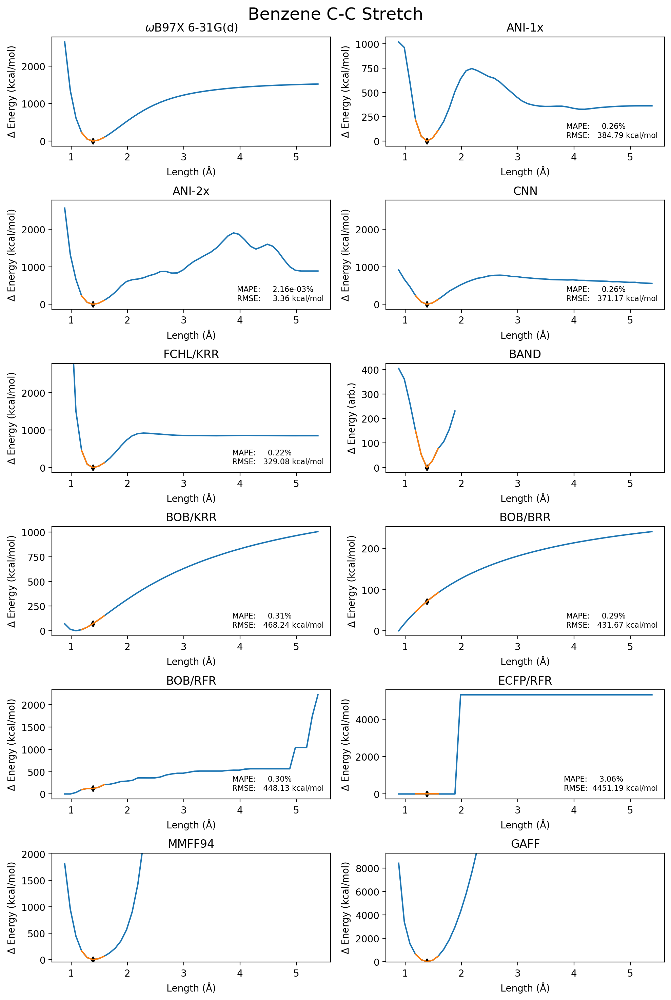

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


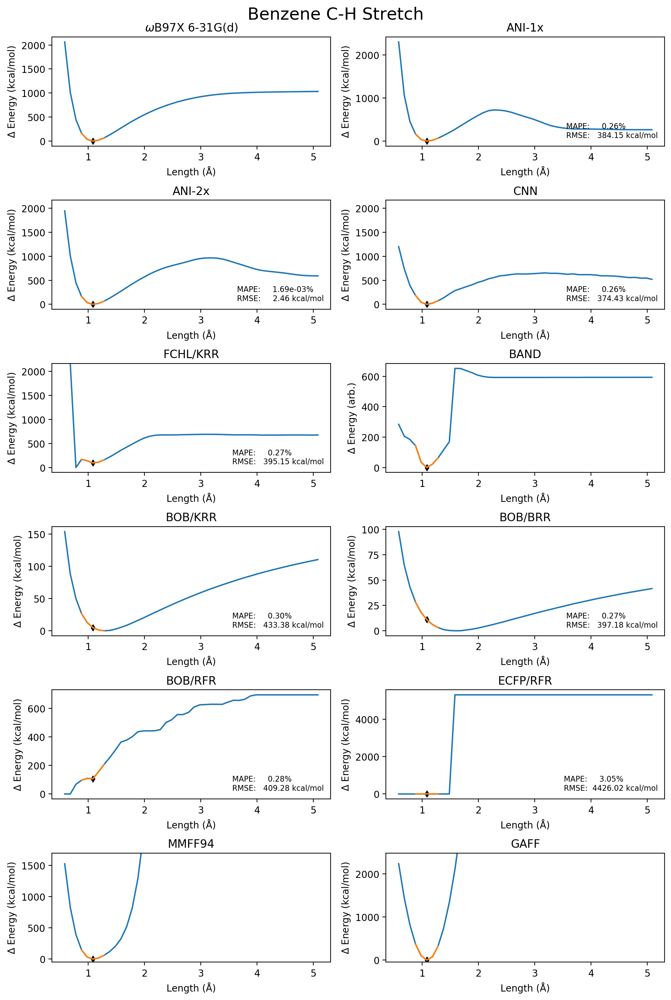

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


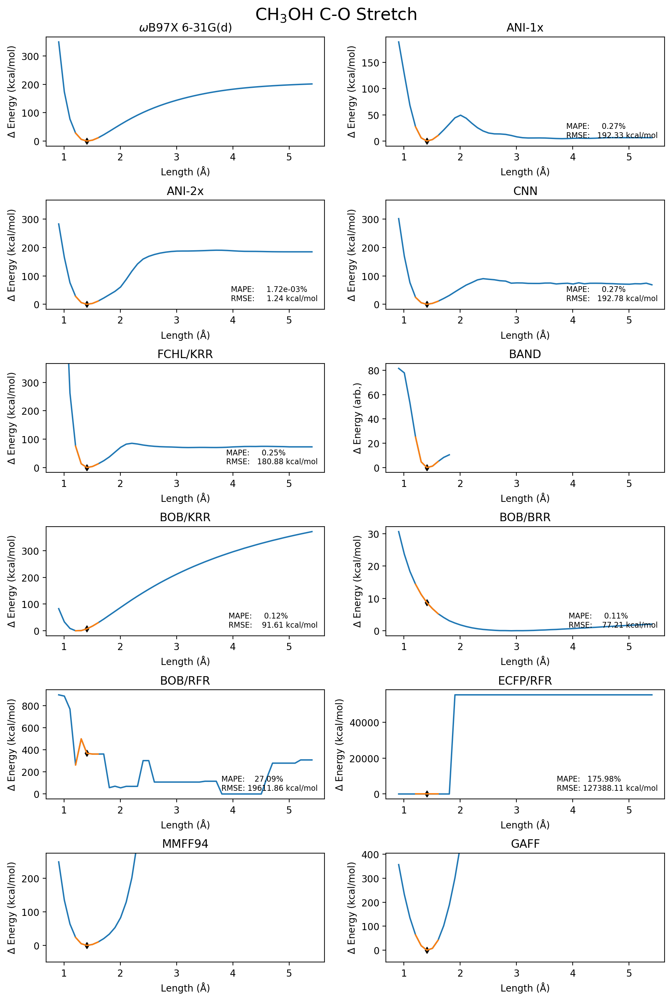

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


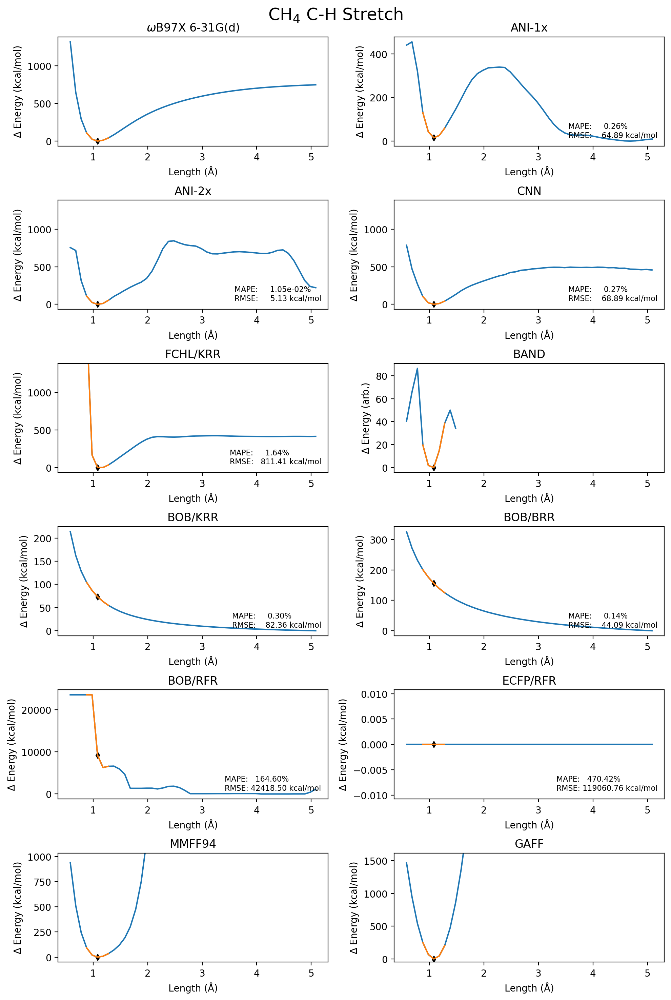

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


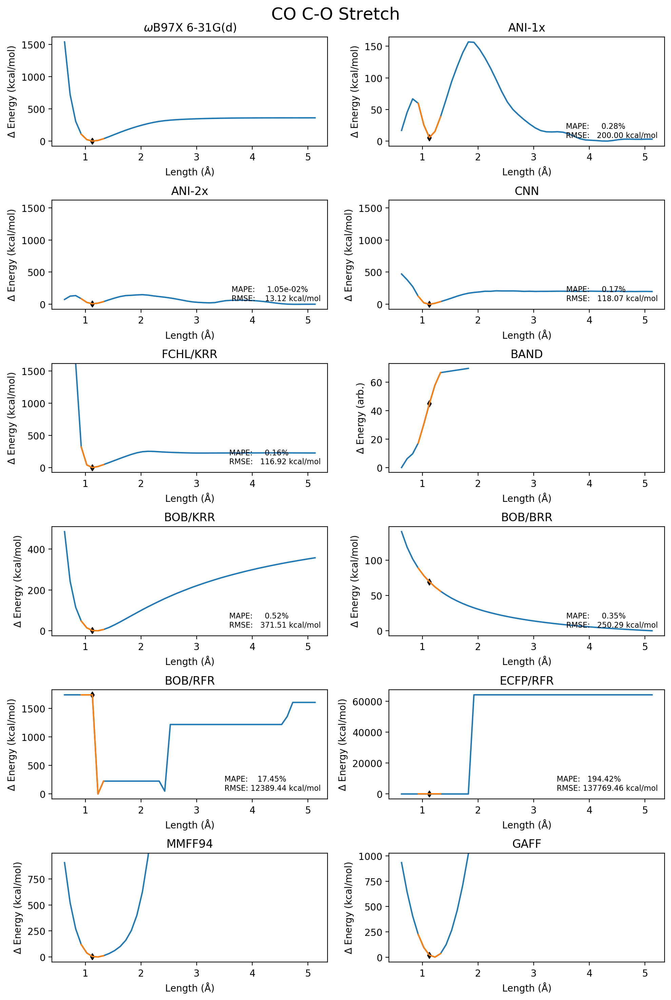

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


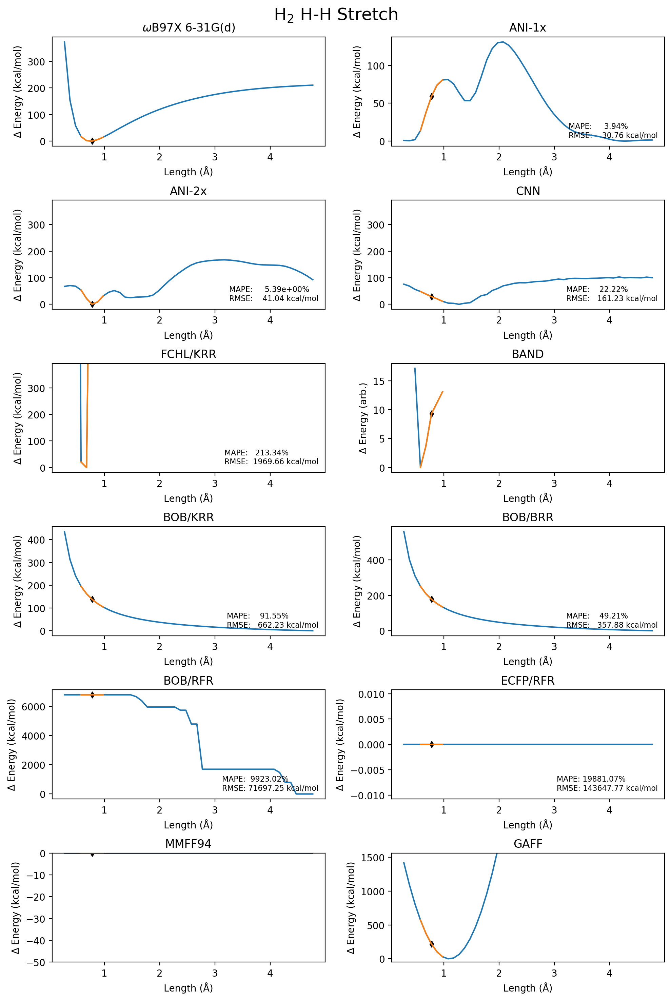

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


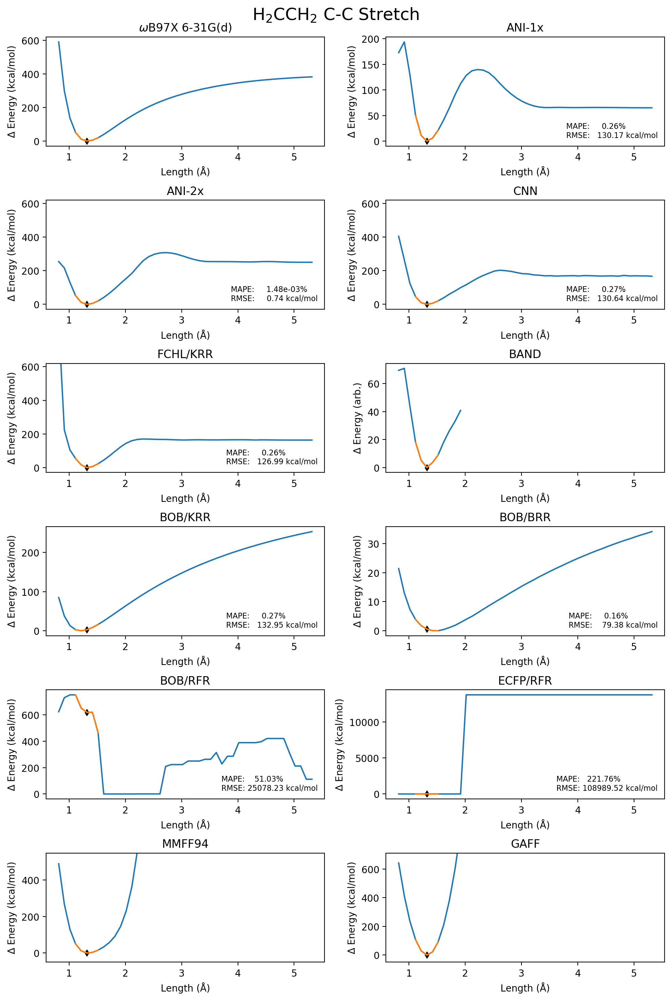

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


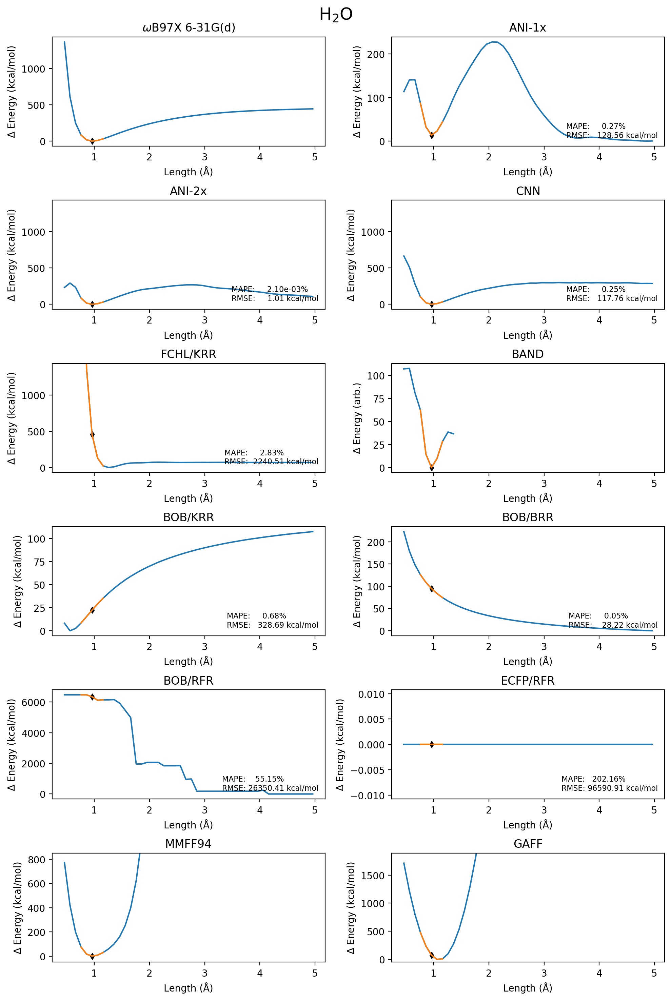

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


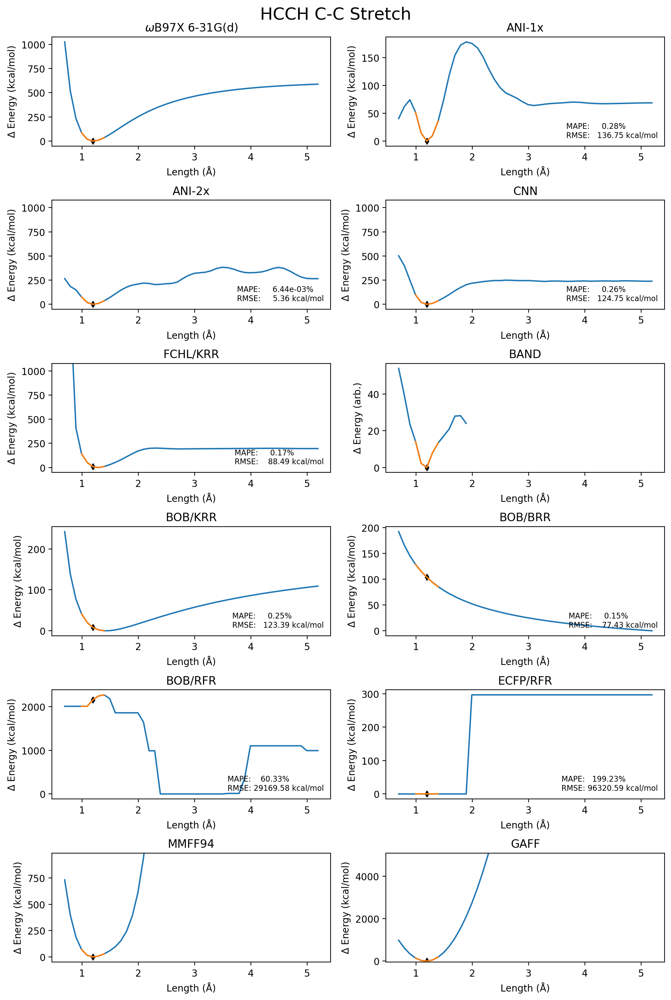

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


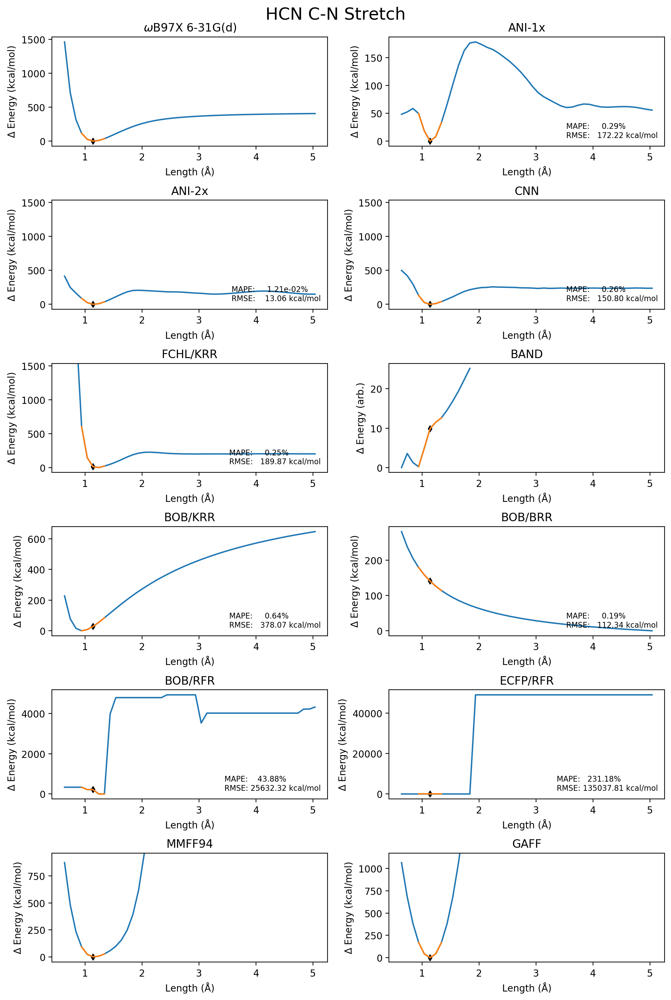

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


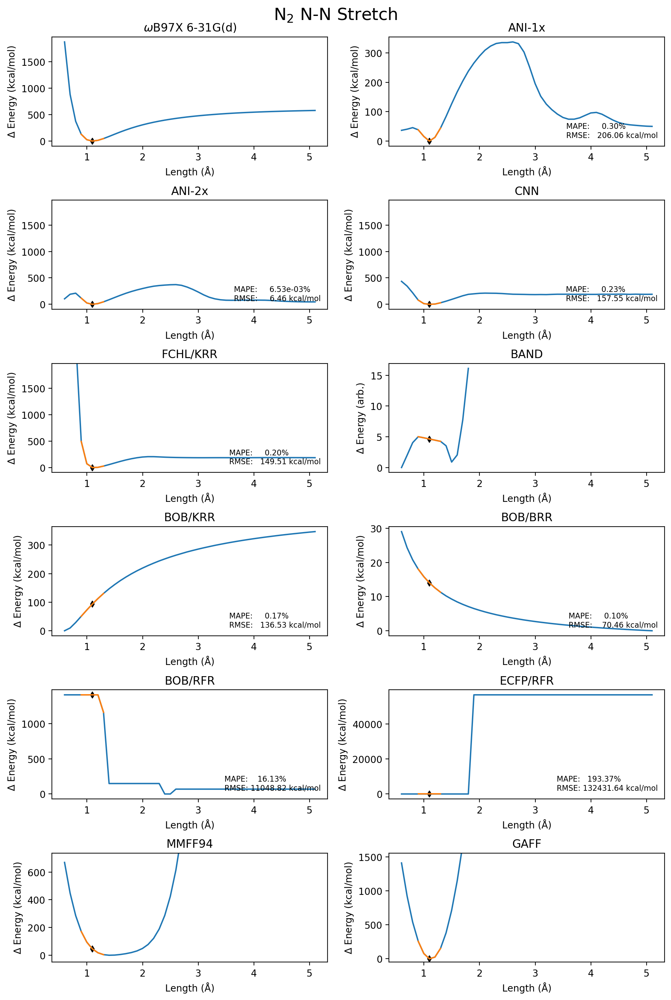

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


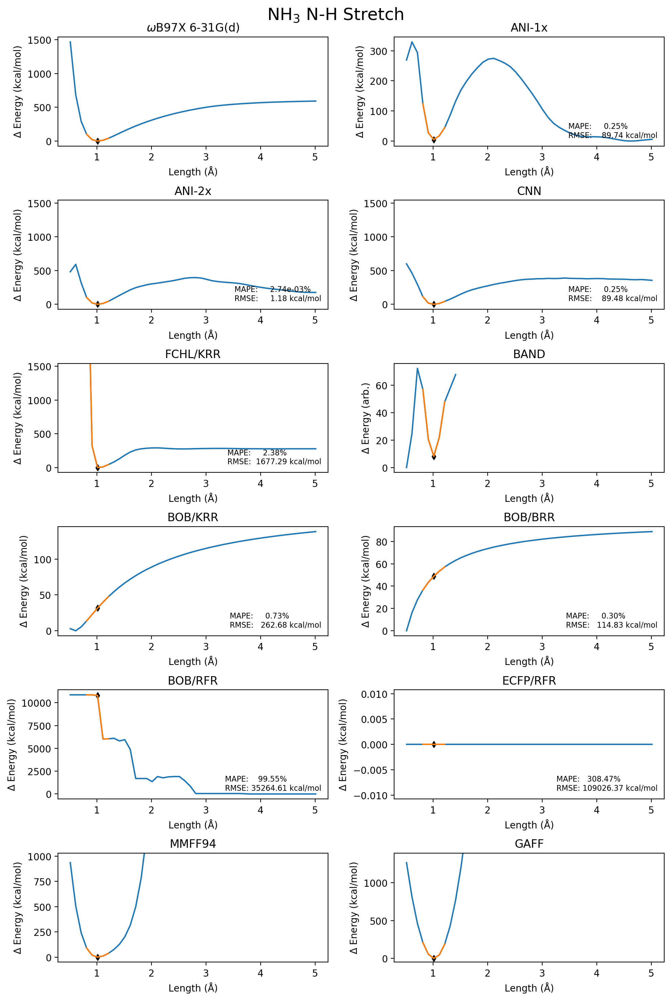

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


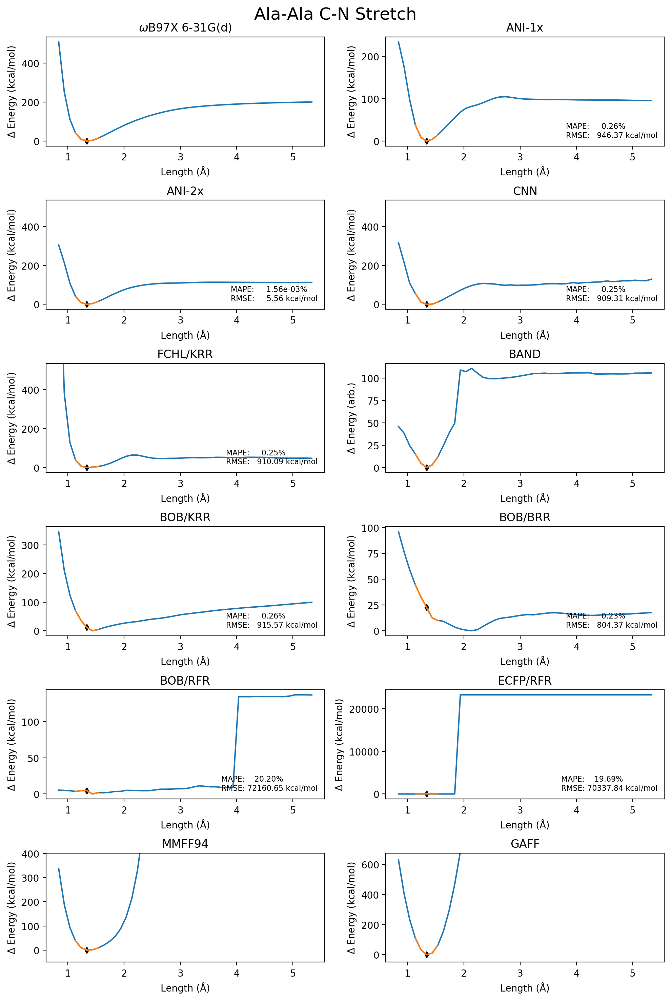

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


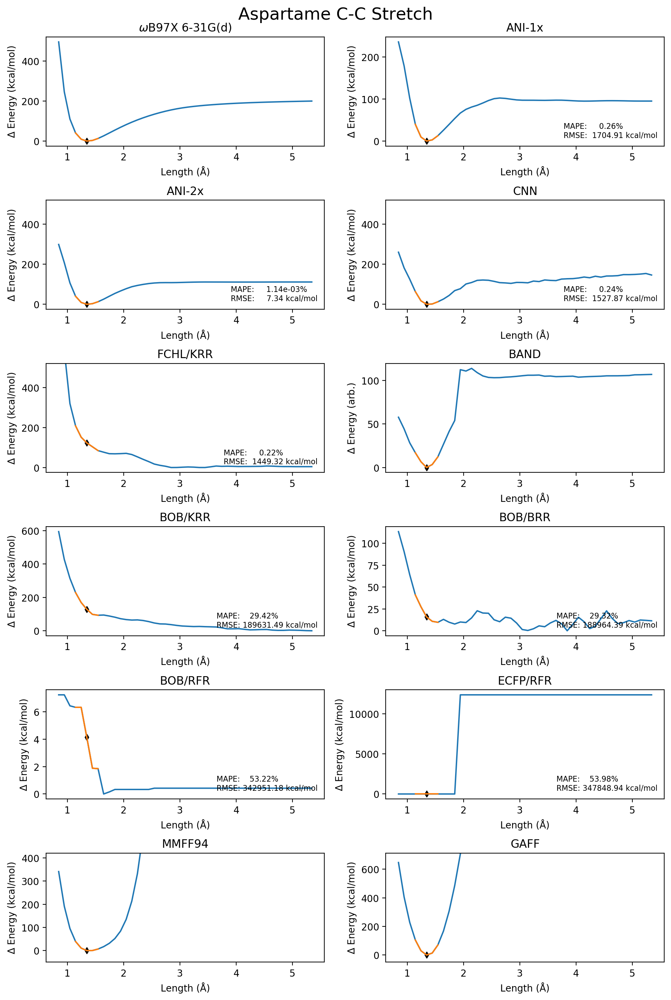

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


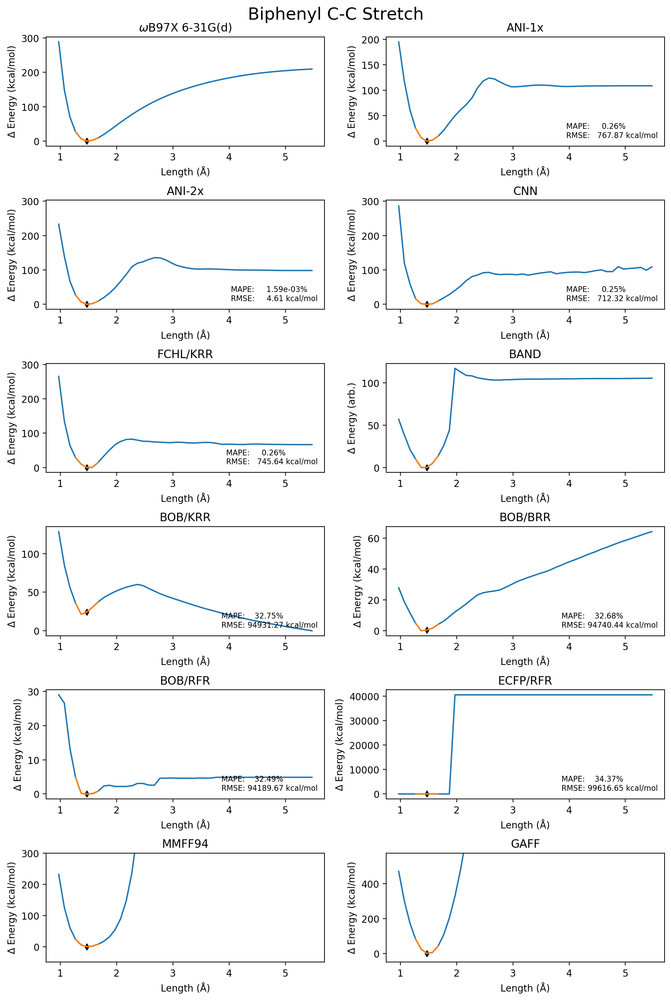

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


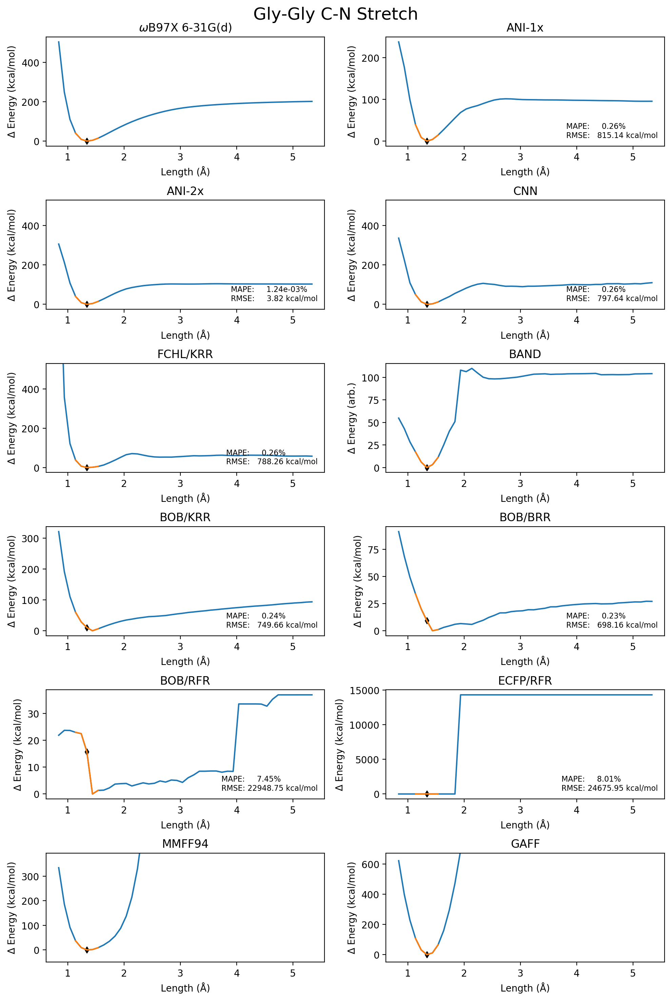

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


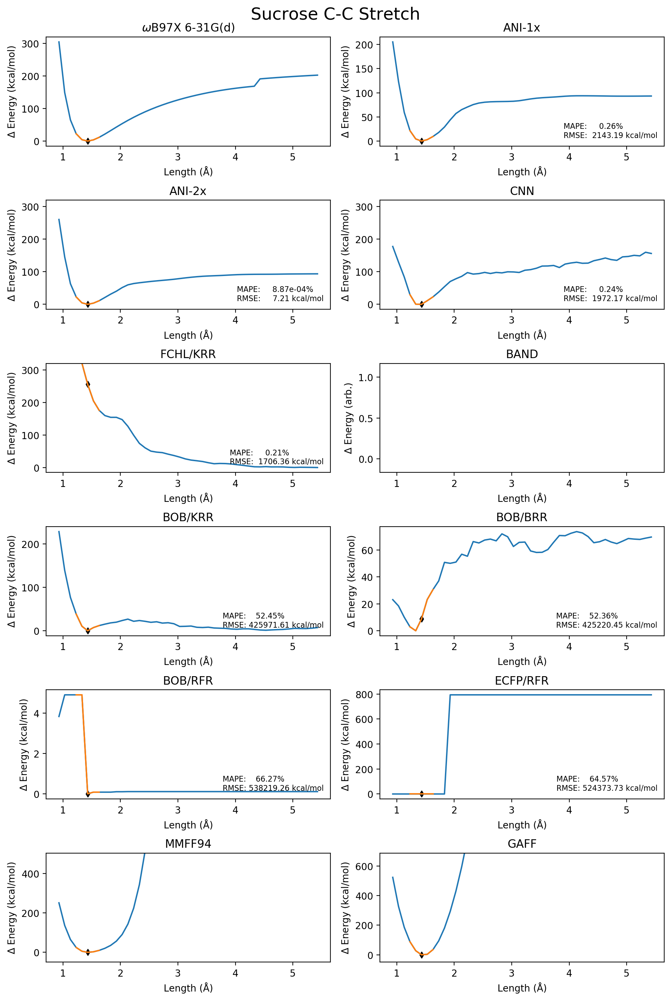

In [13]:
mol_list = list(df['name'].unique())
for molecule in mol_list:
    if molecule == 'HF':
        pass
    else:

        df2 = df.loc[df['name'] == molecule]

        for k in range(len(methods)):
            df2['{}-delta'.format(methods[k])] = df2[methods[k]] - df2[methods[k]].min()

        # make sub df of PES well (+/- 2.5 Angstroms)
        min_E = df2.index[df2['energy'] == df2['energy'].min()].tolist()[0]
        r0 = df2['length'].loc[min_E]
        minus25 = r0 - 0.25
        plus25 = r0 + 0.25
        df3 = df2[(df2['length'] >= minus25) & (df2['length'] <= plus25)]

        fig, axs = plt.subplots(6,2,figsize=(10, 15),dpi=200, sharex=True)
        # fig.subplots_adjust(wspace=.3)
        axs = axs.ravel()

        dft = df3['energy']
        for i in range(len(methods)):
            axs[i].scatter(df2.length.iloc[5], df2['{}-delta'.format(methods[i])].iloc[5], c='k', s=20, marker='d') #r0
            axs[i].plot(df2.length, df2['{}-delta'.format(methods[i])], label=m_name[i])
            axs[i].plot(df3.length, df3['{}-delta'.format(methods[i])], label=m_name[i]) # +/- 0.25 angstroms
#             axs[i].scatter(df2.length.iloc[5], df2['{}-delta'.format(methods[i])].iloc[5], c='k', s=10, marker='*') #r0
            axs[i].set_title(m_name[i])
            axs[i].set_xlabel('Length (Å)')
            axs[i].tick_params(labelbottom=True)
            if methods[i] == 'fchl_energy':
                axs[i].set_ylim(-5, df2['{}-delta'.format(methods[i])][5:].max() + (df2['{}-delta'.format(methods[i])][5:].max() * 0.5))
            if methods[i] != 'energy':
                if methods[i] == 'BAND_energy':
                    axs[i].set_ylabel('$\Delta$ Energy (arb.)')
                elif methods[i] == 'gaff_energy' or methods[i] == 'mmff_energy':
                    axs[i].set_ylabel('$\Delta$ Energy (kcal/mol)')
                    axs[i].set_ylim(-50, 
                                    df2[methods[i]].to_list()[0] + (df2[methods[i]].to_list()[0] * .1))
                elif methods[i] == 'ani2_energy' or methods[i] == 'cnn_energy' or methods[i] == 'fchl_energy':
                    ymin, ymax = axs[0].get_ylim()
                    axs[i].set_ylim(ymin, ymax)
                    if methods[i] == 'ani2_energy':
                        leg = 'MAPE:     {}%\nRMSE: {} kcal/mol'.format('{:.2e}'.format(mape(dft, df3['{}'.format(methods[i])])), 
                                                                    '%8.2f' % rmse(dft, df3['{}'.format(methods[i])]))
                    else:
                        leg = 'MAPE: {}%\nRMSE: {} kcal/mol'.format('%8.2f' % mape(dft, df3['{}'.format(methods[i])]), 
                                                                    '%8.2f' % rmse(dft, df3['{}'.format(methods[i])]))
                    axs[i].legend([leg], loc='lower right', markerscale=0, fontsize=8, handlelength=0, framealpha=0)
                    axs[i].set_ylabel('$\Delta$ Energy (kcal/mol)')
                else:
                    leg = 'MAPE: {}%\nRMSE: {} kcal/mol'.format('%8.2f' % mape(dft, df3['{}'.format(methods[i])]), 
                                                                '%8.2f' % rmse(dft, df3['{}'.format(methods[i])]))
                    axs[i].legend([leg], loc='lower right', markerscale=0, fontsize=8, handlelength=0, framealpha=0)
                    axs[i].set_ylabel('$\Delta$ Energy (kcal/mol)')
            else:
                axs[i].set_ylabel('$\Delta$ Energy (kcal/mol)')

#         axs[11].axis('off')
        fig.suptitle(molec_name[molecule], fontsize=18)
        plt.tight_layout()
        fig.subplots_adjust(top=0.95)
        plt.savefig('paper/si/{}.pdf'.format(molecule))
        plt.show()

## By Method

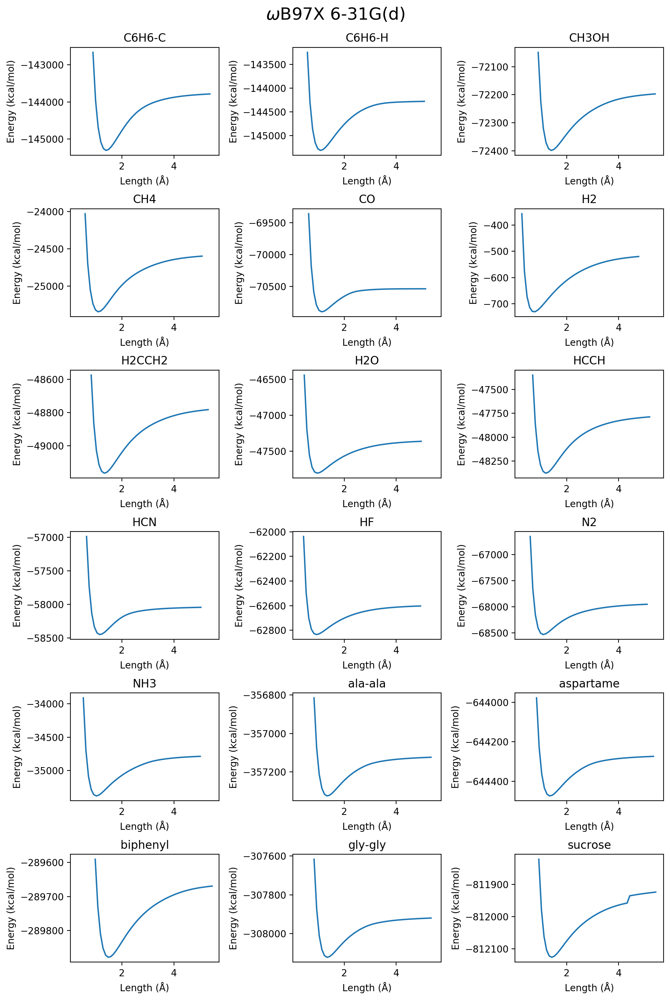

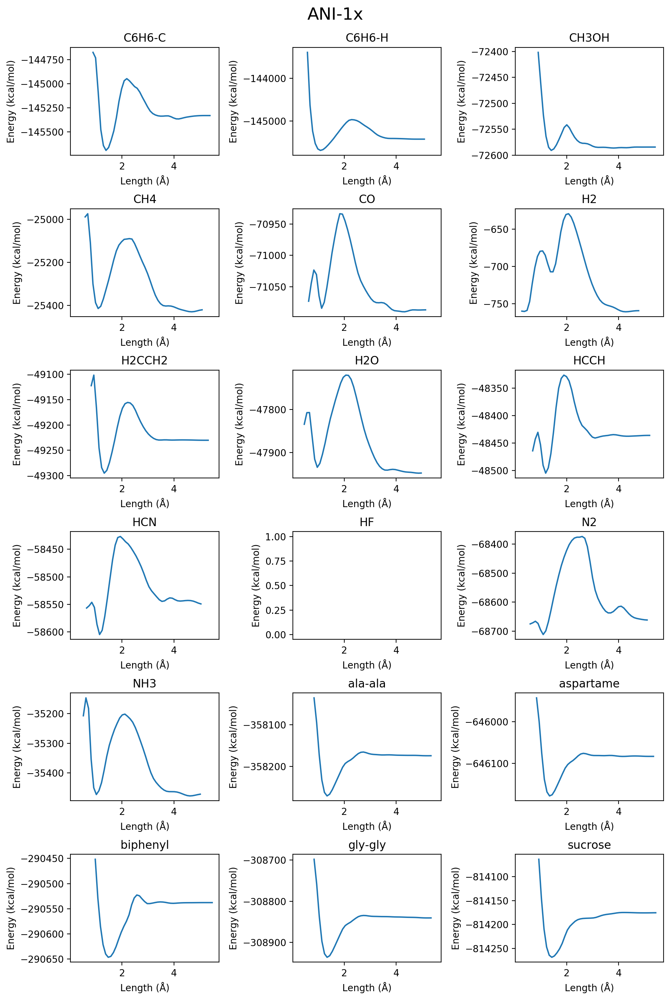

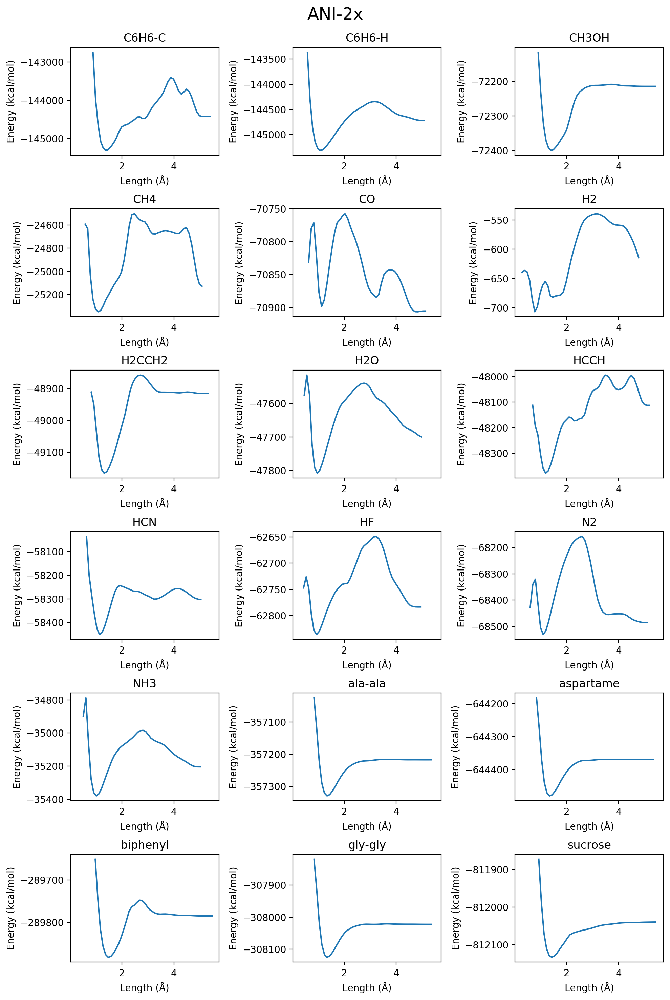

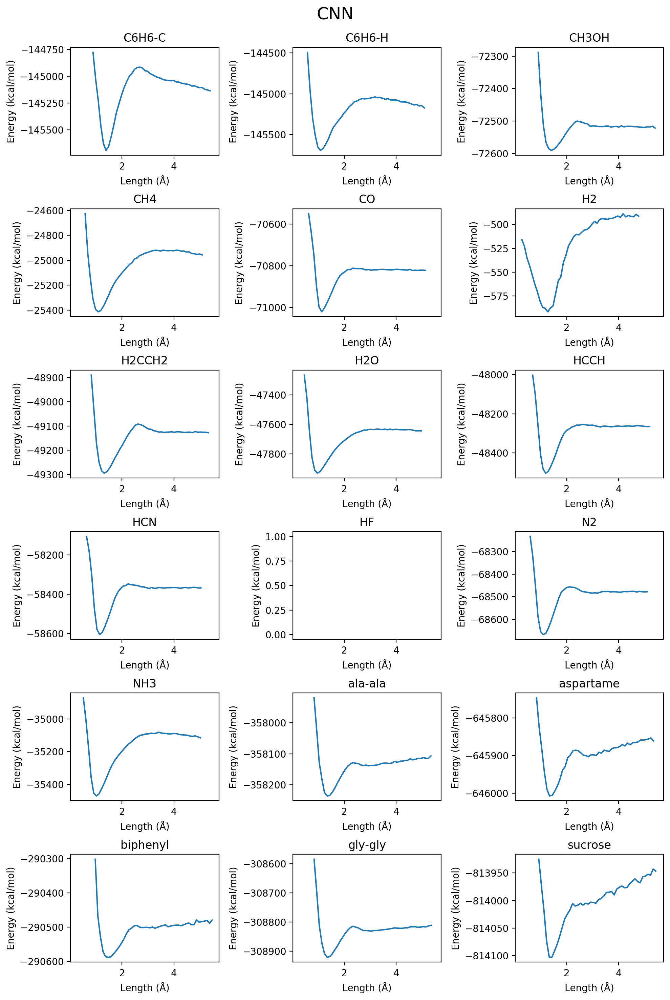

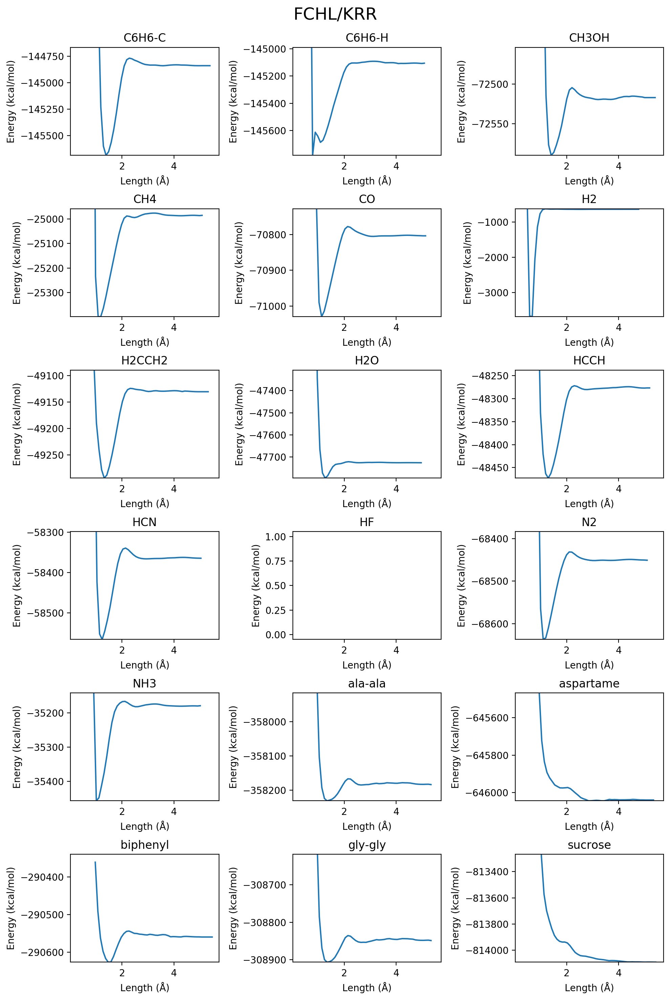

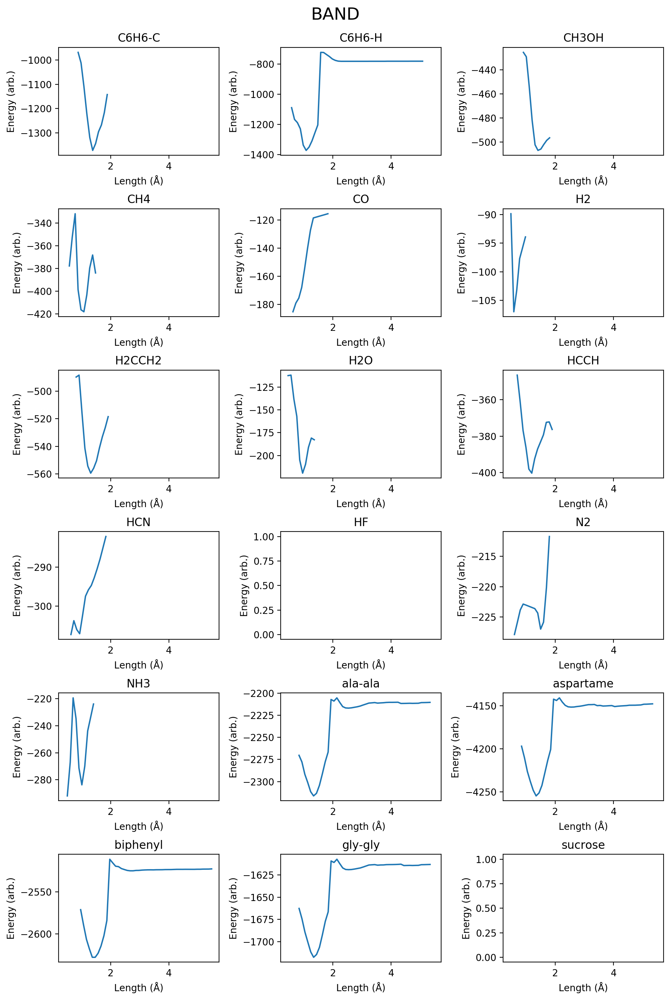

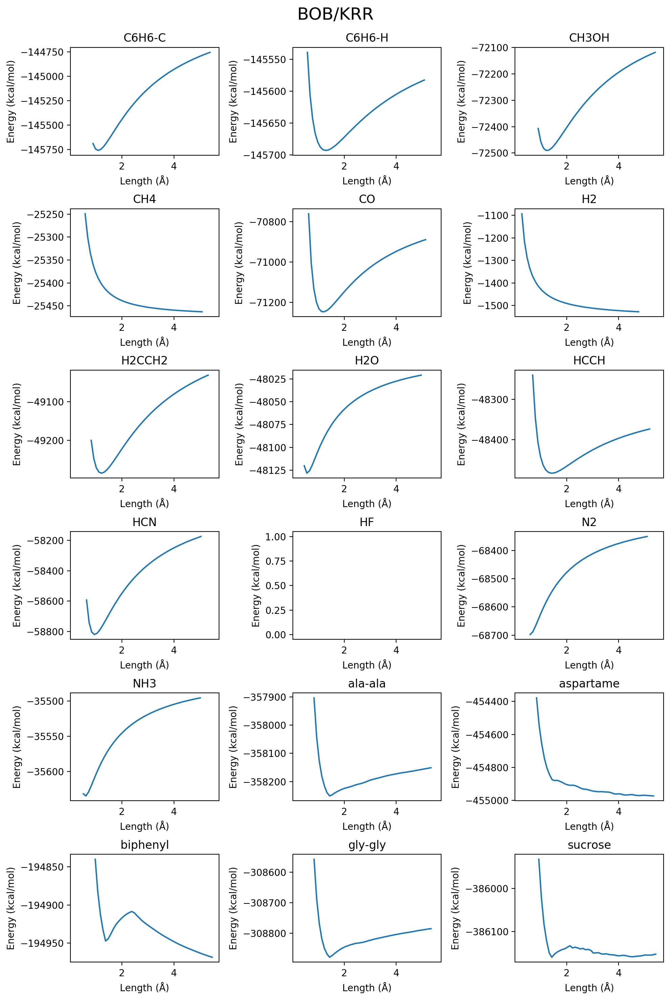

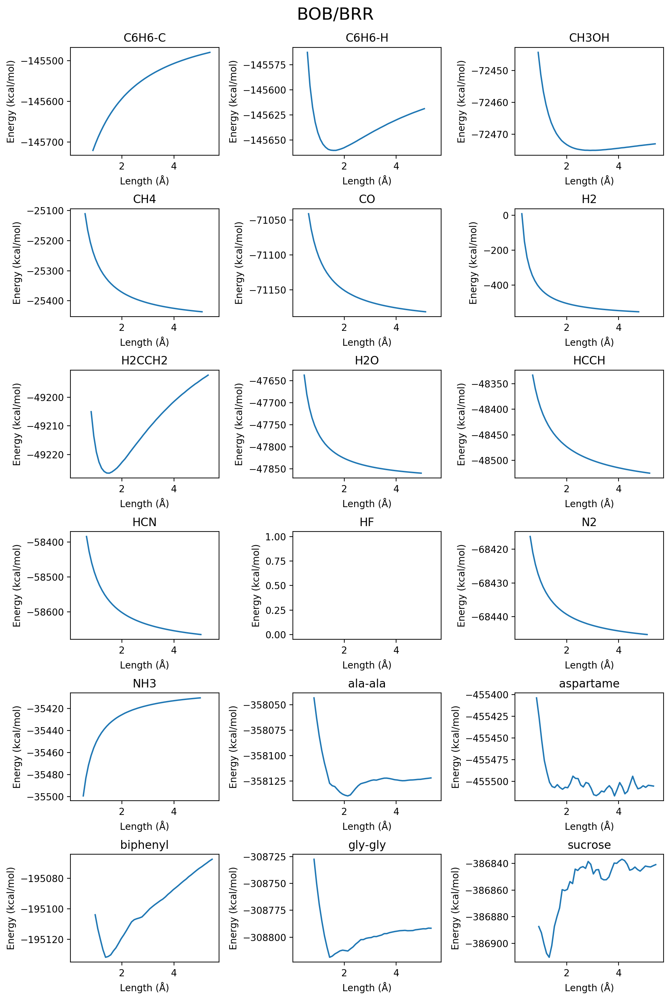

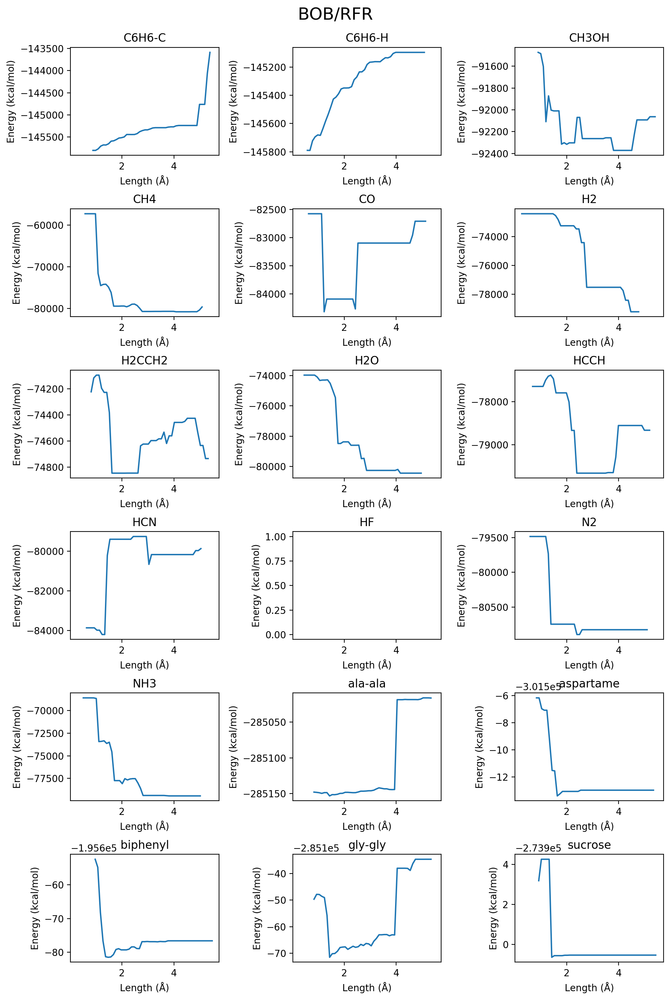

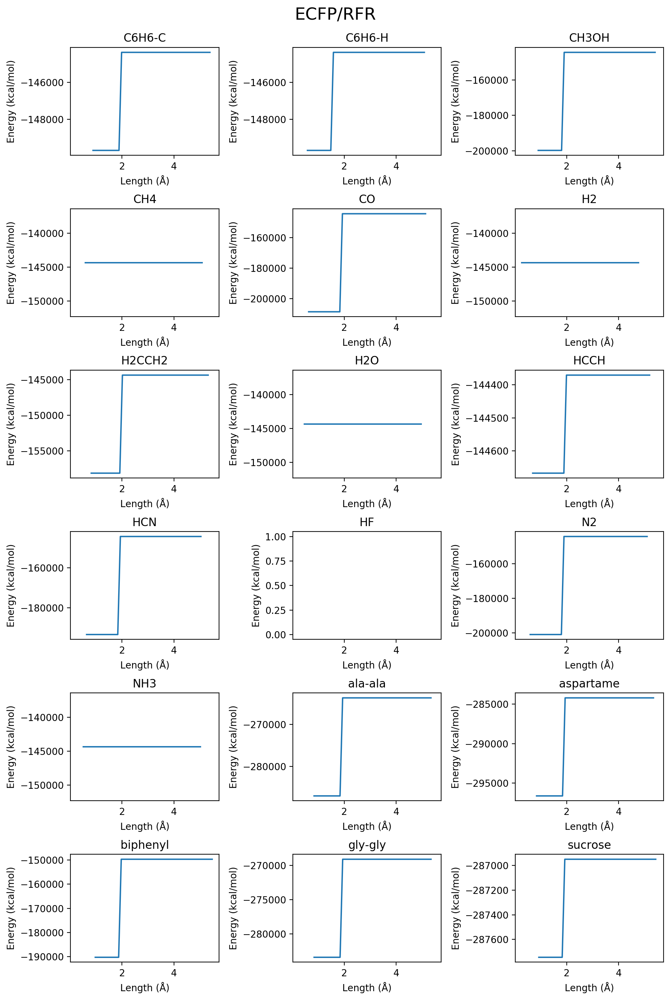

/home/dakota/anaconda3/envs/mlbench/lib/python3.6/site-packages/ipykernel_launcher.py:26: UserWarning: Attempting to set identical bottom == top == 0.0 results in singular transformations; automatically expanding.


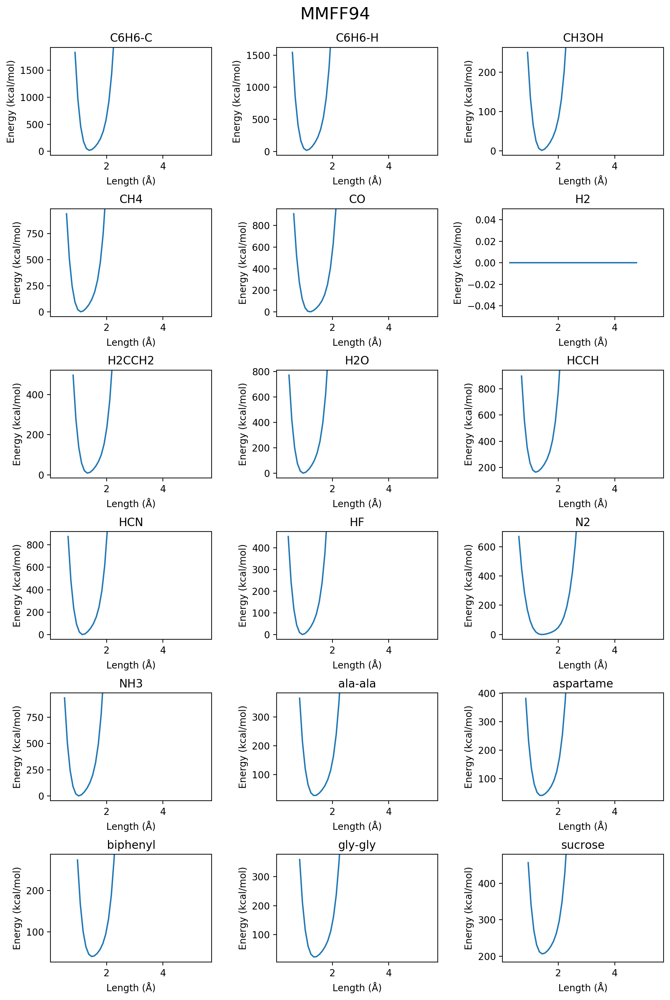

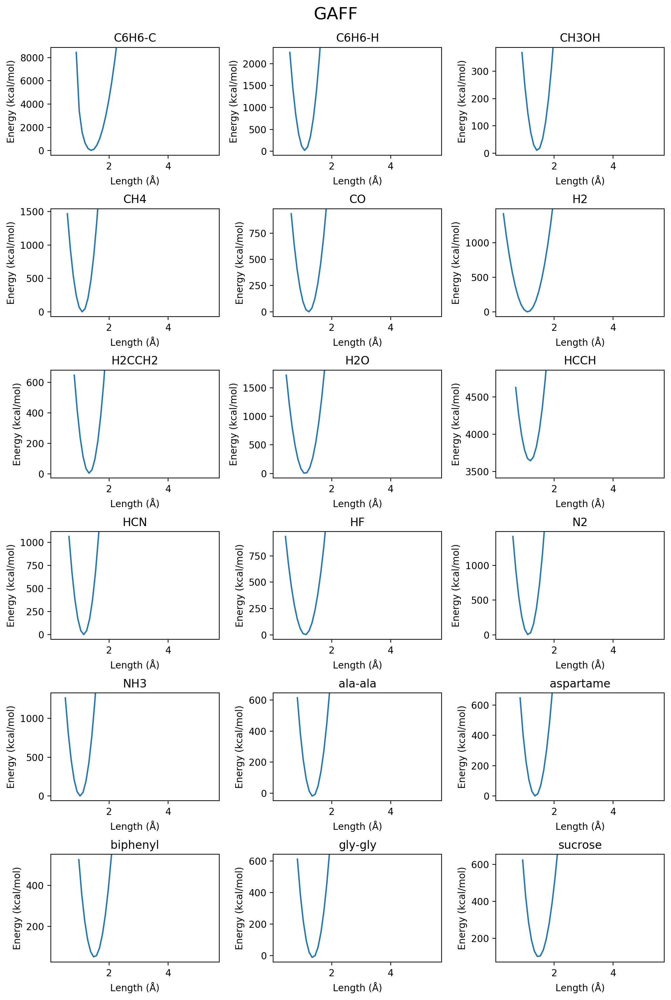

In [14]:
mols = list(df.name.unique())

for j in range(len(methods)):
    fig, axs = plt.subplots(6,3,figsize=(10, 15),dpi=200,sharex=True)
    fig.subplots_adjust(hspace=0.5, wspace=.3)
    axs = axs.ravel()
    for i in range(len(mols)):
    #     for j in range(len(methods)):
        axs[i].plot(df.length[df.name == mols[i]], df[methods[j]][df.name == mols[i]], label=m_name[j])
        axs[i].set_title(mols[i])
        axs[i].set_xlabel('Length (Å)')
        if methods[j] == 'BAND_energy':
            axs[i].set_ylabel('Energy (arb.)')#         plt.savefig('paper/si/{}.pdf'.format(molecule))

        else:
            axs[i].set_ylabel('Energy (kcal/mol)')
        axs[i].tick_params(labelbottom=True)
        if methods[j] == 'fchl_energy':
            if mols[i] == 'HF':
                pass
            else:
                axs[i].set_ylim(df[methods[j]][df.name == mols[i]].min(), 
                                df[methods[j]][df.name == mols[i]][5:].max() - (df[methods[j]][df.name == mols[i]][5:].max() * 0.0007))
        elif methods[j] == 'gaff_energy' or methods[j] == 'mmff_energy':
            axs[i].set_ylim(df[methods[j]][df.name == mols[i]].min() - (df[methods[j]][df.name == mols[i]].to_list()[0] * .05), 
                            df[methods[j]][df.name == mols[i]].to_list()[0] + (df[methods[j]][df.name == mols[i]].to_list()[0] * .05))

    # plt.savefig('data-fig.pdf')
    fig.suptitle(m_name[j], fontsize=18)
    plt.tight_layout()
    fig.subplots_adjust(top=0.94)
    plt.show()

## Dihedral

In [15]:
df = pd.read_csv('../data/data-all-dihedral.csv')
df

,name,phi,psi,theta,energy,ani2_energy,ani1x_energy,cnn_energy,BAND_energy,bobrfr_energy,bobkrr_energy,bobbrr_energy,ecfprfr_energy,fchl_energy,mmff_energy,gaff_energy
0,ala-ala,-100.0,-100.0,NaN,-357302.715141,-357309.519542,-358249.983535,-358224.338179,-2304.801270,-285146.320422,-358257.813482,-358124.337410,-286973.000249,-358218.732315,52.060968,12.837149
1,ala-ala,-100.0,-120.0,NaN,-357299.002503,-357304.908023,-358245.713518,-358227.615996,-2322.531738,-285146.633070,-358265.436107,-358115.114612,-286973.000249,-358226.916416,53.046763,91.990525
2,ala-ala,-100.0,-140.0,NaN,-357220.820854,-357229.552034,-358145.477088,-358157.271742,-2308.384766,-285147.116363,-358251.113052,-358126.281647,-286973.000249,-357984.580254,105.857367,2060.684305
3,ala-ala,-100.0,-160.0,NaN,-357307.493170,-357311.432115,-358252.610142,-358221.750090,-2303.422119,-285146.566888,-358262.896329,-358131.326277,-286973.000249,-358203.573471,51.707037,14.430291
4,ala-ala,-100.0,-180.0,NaN,-357289.506883,-357297.780646,-358238.720227,-358197.657194,-2294.462646,-285145.855770,-358259.762301,-358115.636085,-286973.000249,-358230.002971,64.615650,186.882373
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1122,biphenyl-twist,NaN,NaN,-60.0,-289877.949351,-289882.740877,-290645.865384,-290586.305730,-2628.438477,-195680.577567,-194943.426973,-195134.785962,-190253.321912,-290628.839817,40.320776,58.376349
1123,biphenyl-twist,NaN,NaN,-45.0,-289878.773924,-289883.435894,-290646.531653,-290589.139165,-2627.586426,-195681.485757,-194945.324925,-195132.699578,-190253.321912,-290629.371034,40.710487,53.411610
1124,biphenyl-twist,NaN,NaN,-30.0,-289878.363954,-289882.580404,-290645.525536,-290588.702276,-2627.745361,-195681.485757,-194939.430892,-195126.368943,-190253.321912,-290632.885831,42.685406,53.370726
1125,biphenyl-twist,NaN,NaN,-15.0,-289876.559199,-289880.590350,-290643.686315,-290587.185537,-2628.681152,-195681.485757,-194933.487489,-195121.185553,-190253.321912,-290633.987569,46.569398,66.710071


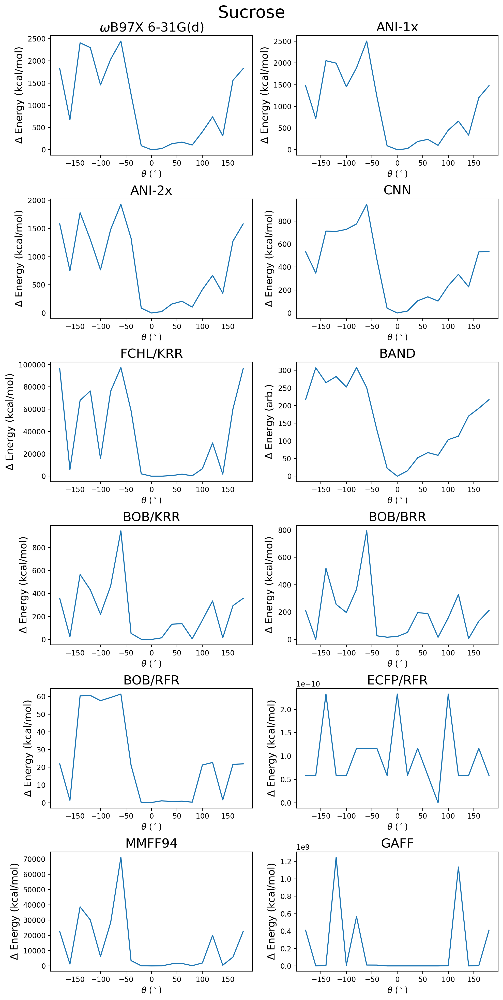

In [16]:
molecule = 'sucrose'
df2 = df.loc[df['name'] == molecule]
df2 = df2.sort_values(by=['theta'])

for k in range(len(methods)):
    df2['{}-delta'.format(methods[k])] = df2[methods[k]] - df2[methods[k]].min()

fig, axs = plt.subplots(6,2,figsize=(10, 20),dpi=200, sharex=True)
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16
# fig.subplots_adjust(wspace=.3)
axs = axs.ravel()

# dft = df3['energy']
for i in range(len(methods)):
    axs[i].plot(df2.theta, df2['{}-delta'.format(methods[i])], label=m_name[i])

    axs[i].set_title(m_name[i], fontsize=18)
    axs[i].set_xlabel('$\\theta$ ($^\circ$)', fontsize=12)
    axs[i].tick_params(labelbottom=True)
    if methods[i] == 'BAND_energy':
        axs[i].set_ylabel('$\Delta$ Energy (arb.)', fontsize=14)
    else:
        axs[i].set_ylabel('$\Delta$ Energy (kcal/mol)', fontsize=14)

# axs[11].axis('off')
fig.suptitle('Sucrose', fontsize=24)
plt.tight_layout()
fig.subplots_adjust(top=0.95)
plt.savefig('paper/si/{}-dihedral.pdf'.format(molecule))
plt.show()

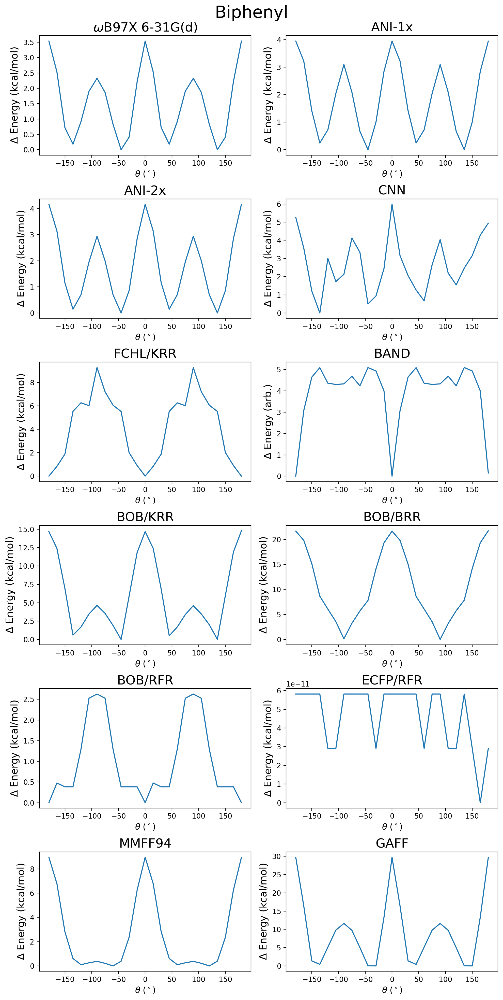

In [17]:
molecule = 'biphenyl-twist'
df2 = df.loc[df['name'] == molecule]
df2 = df2.sort_values(by=['theta'])

for k in range(len(methods)):
    df2['{}-delta'.format(methods[k])] = df2[methods[k]] - df2[methods[k]].min()

fig, axs = plt.subplots(6,2,figsize=(10, 20),dpi=200, sharex=True)
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['axes.titlesize'] = 16
# fig.subplots_adjust(wspace=.3)
axs = axs.ravel()

# dft = df3['energy']
for i in range(len(methods)):
    axs[i].plot(df2.theta, df2['{}-delta'.format(methods[i])], label=m_name[i])

    axs[i].set_title(m_name[i], fontsize=18)
    axs[i].set_xlabel('$\\theta$ ($^\circ$)', fontsize=12)
    axs[i].tick_params(labelbottom=True)
    if methods[i] == 'BAND_energy':
        axs[i].set_ylabel('$\Delta$ Energy (arb.)', fontsize=14)
    else:
        axs[i].set_ylabel('$\Delta$ Energy (kcal/mol)', fontsize=14)

# axs[11].axis('off')
fig.suptitle('Biphenyl', fontsize=24)
plt.tight_layout()
fig.subplots_adjust(top=0.95)
plt.savefig('paper/si/{}-dihedral.pdf'.format(molecule))
plt.show()